In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Sample data representation for illustration purposes
# Replace this with your actual dataset
num_samples = 100
seq_length = 10
num_features = 2  # X and Y coordinates

# Generate random sequence data for demonstration purposes
sequence_data = np.random.rand(num_samples, seq_length, num_features)
len(sequence_data[0])

10

In [ ]:
len(sequence_data[0])

10

In [ ]:
# Sample labels (0 for Class A, 1 for Class B)
labels = np.random.randint(0, 2, size=(num_samples,))
labels

array([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0])

In [ ]:
sequence_data.shape

(100, 10, 2)

In [ ]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame called df with 22850 rows and 2 columns (X and Y)
# Also assuming that the DataFrame is sorted correctly so that each part contains consecutive rows.

# Define the number of parts
num_parts = 10

# Calculate the number of data points in each part
points_per_part = len(sample_data1) // num_parts

# Create an empty list to store the parts
data_parts = []

# Split the DataFrame into parts and store them in the list
for i in range(num_parts):
    start_idx = i * points_per_part
    end_idx = start_idx + points_per_part
    part_data = sample_data1.iloc[start_idx:end_idx]
    data_parts.append(part_data)



In [ ]:
data_parts

[      index      real      imag  class
 0         0  3.086892  5.024217      1
 1         1  2.832553 -7.005559      1
 2         2  4.795890  4.900633      1
 3         3 -4.630670  7.005497      1
 4         4 -5.198531 -1.174179      1
 ...     ...       ...       ...    ...
 2280   2280  3.285256  1.117841      1
 2281   2281  2.953564  6.888694      1
 2282   2282 -2.994905 -5.134286      1
 2283   2283 -7.196660  5.044944      1
 2284   2284 -7.142945 -4.960936      1
 
 [2285 rows x 4 columns],
       index      real      imag  class
 2285      0  3.096739  5.030392      1
 2286      1  2.835003 -6.998514      1
 2287      2  4.788194  4.888341      1
 2288      3 -4.621658  7.014045      1
 2289      4 -5.201286 -1.168768      1
 ...     ...       ...       ...    ...
 4565   2280  3.283709  1.114848      1
 4566   2281  2.955070  6.883781      1
 4567   2282 -2.986275 -5.134861      1
 4568   2283 -7.196613  5.028973      1
 4569   2284 -7.141771 -4.947747      1
 
 [2285 row

In [ ]:
# Convert the list of DataFrames to a list of numpy arrays
data_arrays = [part_data[['real', 'imag']].to_numpy() for part_data in data_parts]



In [ ]:
resulting_array = np.stack(data_arrays)

print(resulting_array.shape)

(10, 2285, 2)


In [ ]:
# Now, data_arrays will be a list of length 10, where each element is a numpy array of shape (2285, 2)
# containing the [X, Y] data points for each part.

# Access the data for a specific part, e.g., part 0:
part_0_data = data_arrays[0]
print(part_0_data.shape)  # Output: (2285, 2)

(2285, 2)


In [ ]:
num_samples = 10
seq_length = 2285
num_features = 2
labels  = [1,1,1,1,1,2,2,2,2,2]
labels = np.array(labels)

In [ ]:
one_hot_labels = tf.keras.utils.to_categorical(labels-1, num_classes=2)

In [ ]:
sample_data1.to_csv("DTF_Data.csv")

# Data Preprocessing for FSK_MATLAB for APEn data

In [ ]:
import pandas as pd
fsk1 = pd.read_csv("/content/fsk_model1.csv")

fsk1.head()

,real_1,real_2,real_3,real_4,real_5,real_6,real_7,real_8,real_9,real_10,...,imag_117,imag_118,imag_119,imag_120,imag_121,imag_122,imag_123,imag_124,imag_125,imag_126
0,0.993273,0.959877,1.134452,0.941737,1.032217,1.000845,0.996512,0.975093,1.001859,0.967234,...,0.020288,0.035409,0.077109,-0.083433,0.005972,-0.021060,-0.070644,-0.056736,0.063684,-0.066987
1,0.944793,1.015842,1.013102,1.043104,0.907346,1.051685,0.945357,0.977013,0.897906,0.872349,...,-0.089437,-0.227239,-0.255593,-0.217257,-0.086224,-0.162889,-0.085777,-0.172580,-0.090305,-0.127912
2,0.987092,0.854978,0.881787,1.024675,0.998171,0.905295,0.864961,0.920404,0.745646,1.053373,...,-0.098340,-0.335744,-0.337808,-0.307979,-0.187990,-0.376207,-0.115414,-0.046910,-0.410666,0.046068
3,0.900129,0.849084,0.801304,0.969754,1.007987,0.922713,0.864146,0.867688,0.824700,1.057456,...,-0.163080,-0.568335,-0.551595,-0.510896,-0.248037,-0.509572,-0.150431,-0.180498,-0.470206,-0.149867
4,0.884032,0.739199,0.731105,0.899772,0.912564,0.960516,0.578240,0.982143,0.706622,0.966930,...,-0.224579,-0.726035,-0.710997,-0.626986,-0.329897,-0.642209,-0.340029,-0.199427,-0.642703,-0.157637


In [ ]:

import pandas as pd

fsk = pd.read_csv("/content/fsk_model3.csv")
# Step 2: Get the list of columns starting with "real"
real_columns = [col for col in fsk.columns if col.startswith('real')]
imag_columns = [col for col in fsk.columns if col.startswith('imag')]

fsk3_data = pd.DataFrame()
# Step 3: Append the data from all "real" columns into a new column "Real"
fsk3_data['real'] = fsk[real_columns].stack().reset_index(drop=True)
fsk3_data['imag'] = fsk[imag_columns].stack().reset_index(drop=True)

fsk3_data.to_csv("fsk3_data.csv")


GE_Data-> Approximate Entropy based Classification

In [ ]:
import pandas as pd
import numpy as np
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
import scipy

warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
from sklearn import linear_model, metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
import sklearn.preprocessing
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier as XGBC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier,RandomForestClassifier,VotingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve,recall_score, confusion_matrix, precision_score, fbeta_score, f1_score, accuracy_score, classification_report
from matplotlib.gridspec import GridSpec
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report


from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer


In [ ]:
import pandas as pd
df = pd.read_excel("/content/APEN DATA.xlsx")
class0 = df[df.Class == "class0"].reset_index()
class1 = df[df.Class == "class1"].reset_index()
class2 = df[df.Class == "class2"].reset_index()
class3 = df[df.Class == "class3"].reset_index()
class4 = df[df.Class == "class4"].reset_index()
class5 = df[df.Class == "class5"].reset_index()
class6 = df[df.Class == "class6"].reset_index()
class7 = df[df.Class == "class7"].reset_index()
class8 = df[df.Class == "class8"].reset_index()
class9 = df[df.Class == "class9"].reset_index()
class10 = df[df.Class == "class10"].reset_index()
class11 = df[df.Class == "class11"].reset_index()

df_singleclass = class0[class0.index==1].reset_index()
df1_singleclass = class1[class1.index==1].reset_index()
df2_singleclass = class2[class2.index==1].reset_index()
df3_singleclass = class3[class3.index==1].reset_index()
df4_singleclass = class4[class4.index==1].reset_index()
df5_singleclass = class5[class5.index==1].reset_index()

df6_singleclass = class6[class6.index==1].reset_index()
df7_singleclass = class7[class7.index==1].reset_index()
df8_singleclass = class8[class8.index==1].reset_index()
df9_singleclass = class9[class9.index==1].reset_index()
df10_singleclass = class10[class10.index==1].reset_index()
df11_singleclass = class11[class11.index==1].reset_index()


<Figure size 1000x400 with 0 Axes>

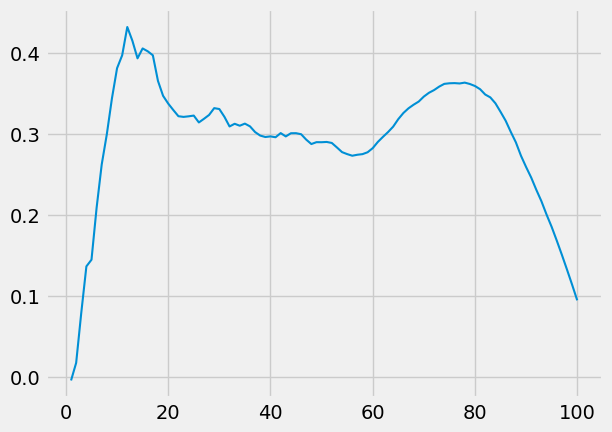

In [ ]:
import numpy as np
r_values = np.arange(1, 101)

df_singleclass = df[df.index==1]
plt.figure(figsize=(10,4))
y = df_singleclass.values[0][:-2]
x = r_values

# Create an axes object
fig, ax = plt.subplots()

# Use the axes object 'ax' as the 'ax' parameter in lineplot()
sns.lineplot(x=x, y=y, linewidth=1.5, ax=ax)

# Show the plot
plt.show()

<Figure size 1000x400 with 0 Axes>

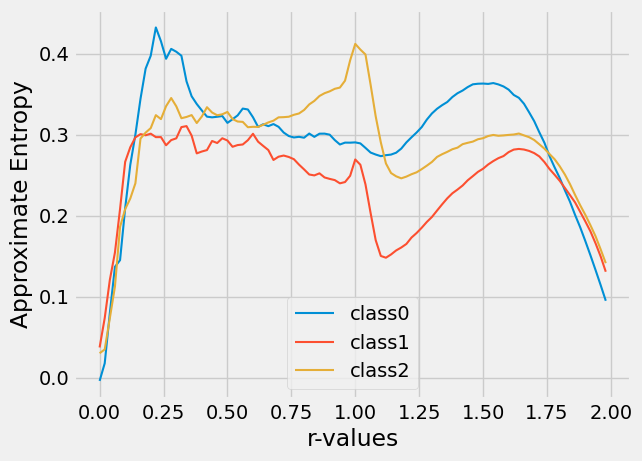

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

r_values = np.arange(0, 2, 0.02)

# Assuming 'df', 'df1', and 'df2' are your DataFrames containing the data

plt.figure(figsize=(10, 4))

# Extract y values for df
y_df = df_singleclass.values[0][:-2]

x = r_values

# Create an axes object
fig, ax = plt.subplots()

# Plot first line plot for df
sns.lineplot(x=x, y=y_df, linewidth=1.5, ax=ax, label='class0')

# Extract y values for df1
y_df1 = df1_singleclass.values[0][2:-2]

# Plot second line plot for df1
sns.lineplot(x=x, y=y_df1, linewidth=1.5, ax=ax, label='class1')

# Extract y values for df2
y_df2 = df2_singleclass.values[0][2:-2]

# Plot third line plot for df2
sns.lineplot(x=x, y=y_df2, linewidth=1.5, ax=ax, label='class2')

# Show the legend
ax.legend()
plt.xlabel('r-values')
plt.ylabel('Approximate Entropy')
# Show the plot
plt.show()


<Axes: ylabel='Density'>

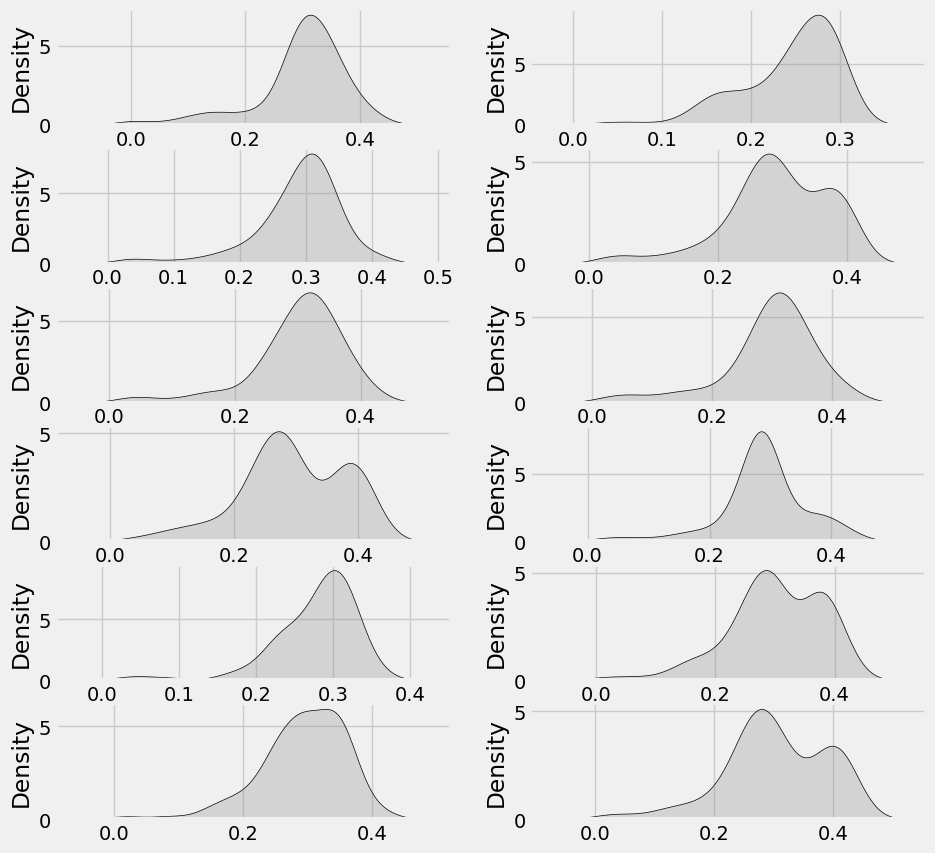

In [ ]:
f, axs = plt.subplots(6, 2, figsize=(10, 10), gridspec_kw=dict(width_ratios=[4, 4]))
sns.kdeplot(data=df_singleclass.values[0][:-2], label="class0", shade=True, color = "grey", edgecolor = "black", ax= axs[0,0])
sns.kdeplot(data=df1_singleclass.values[0][2:-2], label="class1", shade=True,color = "grey", edgecolor = "black", ax= axs[0,1])
sns.kdeplot(data=df2_singleclass.values[0][2:-2], label="class2", shade=True,color = "grey", edgecolor = "black", ax= axs[1,0])
sns.kdeplot(data=df3_singleclass.values[0][2:-2], label="class3", shade=True,color = "grey", edgecolor = "black", ax= axs[1,1])
sns.kdeplot(data=df4_singleclass.values[0][2:-2], label="class4", shade=True, color = "grey", edgecolor = "black", ax= axs[2,0])
sns.kdeplot(data=df5_singleclass.values[0][2:-2], label="class5", shade=True, color = "grey", edgecolor = "black", ax= axs[2,1])

sns.kdeplot(data=df6_singleclass.values[0][2:-2], label="class6", shade=True, color = "grey", edgecolor = "black", ax= axs[3,0])
sns.kdeplot(data=df7_singleclass.values[0][2:-2], label="class7", shade=True,color = "grey", edgecolor = "black", ax= axs[3,1])
sns.kdeplot(data=df8_singleclass.values[0][2:-2], label="class8", shade=True,color = "grey", edgecolor = "black", ax= axs[4,0])
sns.kdeplot(data=df9_singleclass.values[0][2:-2], label="class9", shade=True,color = "grey", edgecolor = "black", ax= axs[4,1])
sns.kdeplot(data=df10_singleclass.values[0][2:-2], label="class10", shade=True, color = "grey", edgecolor = "black", ax= axs[5,0])
sns.kdeplot(data=df11_singleclass.values[0][2:-2], label="class11", shade=True, color = "grey", edgecolor = "black", ax= axs[5,1])

#lw=2 for edge width


<Axes: ylabel='Density'>

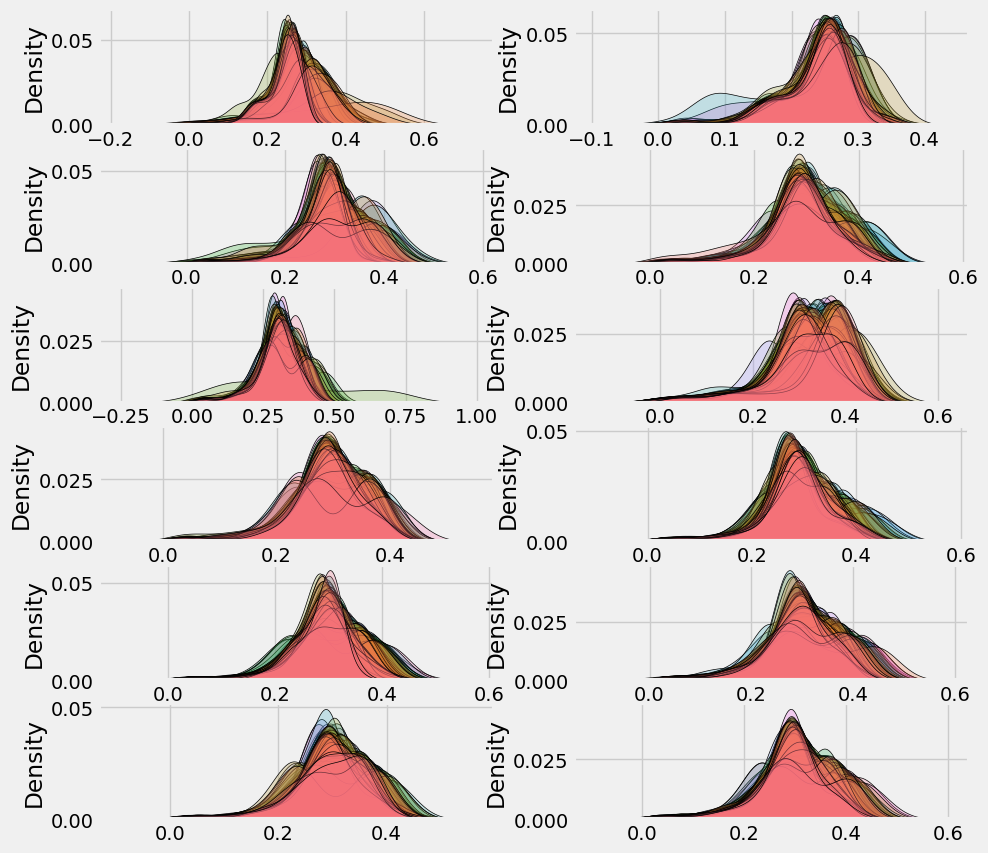

In [ ]:
f, axs = plt.subplots(6, 2, figsize=(10, 10), gridspec_kw=dict(width_ratios=[4, 4]))
sns.kdeplot(data=class0.iloc[:, 1:-2].T.values, label="class0", shade=True, color = "grey", edgecolor = "black", ax= axs[0,0], legend=False)
sns.kdeplot(data=class1.iloc[:, 1:-2].T.values, label="class1", shade=True,color = "grey", edgecolor = "black", ax= axs[0,1], legend=False)
sns.kdeplot(data=class2.iloc[:, 1:-2].T.values, label="class2", shade=True,color = "grey", edgecolor = "black", ax= axs[1,0], legend=False)
sns.kdeplot(data=class3.iloc[:, 1:-2].T.values, label="class3", shade=True,color = "grey", edgecolor = "black", ax= axs[1,1], legend=False)
sns.kdeplot(data=class4.iloc[:, 1:-2].T.values, label="class4", shade=True, color = "grey", edgecolor = "black", ax= axs[2,0], legend=False)
sns.kdeplot(data=class5.iloc[:, 1:-2].T.values, label="class5", shade=True, color = "grey", edgecolor = "black", ax= axs[2,1], legend=False)

sns.kdeplot(data=class6.iloc[:, 1:-2].T.values, label="class6", shade=True, color = "grey", edgecolor = "black", ax= axs[3,0], legend=False)
sns.kdeplot(data=class7.iloc[:, 1:-2].T.values, label="class7", shade=True,color = "grey", edgecolor = "black", ax= axs[3,1], legend=False)
sns.kdeplot(data=class8.iloc[:, 1:-2].T.values, label="class8", shade=True,color = "grey", edgecolor = "black", ax= axs[4,0], legend=False)
sns.kdeplot(data=class9.iloc[:, 1:-2].T.values, label="class9", shade=True,color = "grey", edgecolor = "black", ax= axs[4,1], legend=False)
sns.kdeplot(data=class10.iloc[:, 1:-2].T.values, label="class10", shade=True, color = "grey", edgecolor = "black", ax= axs[5,0], legend=False)
sns.kdeplot(data=class11.iloc[:, 1:-2].T.values, label="class11", shade=True, color = "grey", edgecolor = "black", ax= axs[5,1], legend=False)


Shapiro test

In [ ]:
class0.iloc[:, 1:-2].T.head()
#columns represents a unique sample from a class0 RF transmitter
# r1 ro r100 are Approximate entropy values at toleration value r

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
r1,0.032755,-0.003929,0.018597,0.019523,0.013218,0.017508,-0.003929,0.019470,0.017991,0.010334,...,0.010694,-0.003929,0.014582,0.007363,0.035514,0.013223,0.011838,0.027294,0.013855,0.012998
r2,0.059440,0.017817,0.062925,0.057552,0.031048,0.049247,0.001507,0.039376,0.048849,0.031975,...,0.057207,0.034083,0.052934,0.050680,0.056936,0.060130,0.044043,0.037090,0.036049,0.038096
r3,0.102761,0.079631,0.080662,0.130112,0.054316,0.102039,0.044956,0.082743,0.074452,0.057245,...,0.105265,0.045294,0.103865,0.097197,0.137747,0.077153,0.078722,0.086109,0.055931,0.088418
r4,0.169016,0.136887,0.123437,0.188643,0.117296,0.147784,0.094615,0.153655,0.112948,0.109242,...,0.204734,0.117443,0.137167,0.129828,0.179611,0.160185,0.130070,0.131218,0.091001,0.156410
r5,0.226698,0.145137,0.183571,0.192898,0.234194,0.219371,0.169475,0.232070,0.165102,0.166650,...,0.244824,0.195462,0.189270,0.193436,0.209513,0.220232,0.179145,0.191004,0.146542,0.254839


In [ ]:
from scipy.stats import shapiro, normaltest
# shapiro-Wilk Test
shapiro_df = class0.iloc[:, 1:-2].T
columns = np.arange(1, 200)
stat = [];p = [];gauss = [];feature = []
for column in columns:
    s_, p_ = shapiro(shapiro_df[column])
    feature.append(column)
    stat.append(s_)
    p.append(p_)
    if p_ > 0.05:
        gauss.append('Gaussian')
    else:
        gauss.append('Not Gaussian')

shapiro = pd.DataFrame(list(zip(feature, stat, p, gauss)),
               columns =['feature', 'stat', 'p-value', 'distribution'])
shapiro["Test"] = "Shapiro-Wilk"
shapiro

,feature,stat,p-value,distribution,Test
0,1,0.856411,2.061087e-08,Not Gaussian,Shapiro-Wilk
1,2,0.786016,9.418006e-11,Not Gaussian,Shapiro-Wilk
2,3,0.846696,8.970828e-09,Not Gaussian,Shapiro-Wilk
3,4,0.879090,1.661270e-07,Not Gaussian,Shapiro-Wilk
4,5,0.851956,1.401514e-08,Not Gaussian,Shapiro-Wilk
...,...,...,...,...,...
194,195,0.791232,1.343860e-10,Not Gaussian,Shapiro-Wilk
195,196,0.777733,5.418279e-11,Not Gaussian,Shapiro-Wilk
196,197,0.803513,3.178685e-10,Not Gaussian,Shapiro-Wilk
197,198,0.806125,3.834787e-10,Not Gaussian,Shapiro-Wilk


Skewness

In [ ]:
# for class 0
from scipy.stats import skew, kurtosis
class0.iloc[:, 1:-2].T.skew()


0     -1.656053
1     -1.593648
2     -1.869778
3     -1.543785
4     -1.541389
         ...   
195   -1.886222
196   -1.998924
197   -1.946727
198   -1.863957
199   -1.974966
Length: 200, dtype: float64

In [ ]:
# for class 1
from scipy.stats import skew, kurtosis
class1.iloc[:, 1:-2].T.skew()


0     -1.658510
1     -1.277474
2     -1.528664
3     -1.348954
4     -1.391804
         ...   
195   -1.465560
196   -1.712541
197   -1.649223
198   -1.682750
199   -1.726938
Length: 200, dtype: float64

In [ ]:
class0

,index,r1,r2,r3,r4,r5,r6,r7,r8,r9,...,r93,r94,r95,r96,r97,r98,r99,r100,Filename,Class
0,0,0.032755,0.059440,0.102761,0.169016,0.226698,0.234629,0.267499,0.297018,0.288309,...,0.227689,0.218576,0.203325,0.190507,0.176628,0.162421,0.145996,0.128832,'day1_class0_0.csv',class0
1,1,-0.003929,0.017817,0.079631,0.136887,0.145137,0.209241,0.262718,0.300090,0.344324,...,0.217263,0.200855,0.185620,0.168687,0.151125,0.132901,0.114270,0.094979,'day1_class0_1.csv',class0
2,2,0.018597,0.062925,0.080662,0.123437,0.183571,0.234360,0.271808,0.278203,0.293704,...,0.226359,0.215219,0.204960,0.194303,0.180745,0.165172,0.149429,0.128184,'day1_class0_10.csv',class0
3,3,0.019523,0.057552,0.130112,0.188643,0.192898,0.234826,0.250953,0.270120,0.285666,...,0.227342,0.217537,0.208870,0.199645,0.187226,0.172084,0.153386,0.133765,'day1_class0_100.csv',class0
4,4,0.013218,0.031048,0.054316,0.117296,0.234194,0.269059,0.317237,0.346290,0.346144,...,0.227762,0.215249,0.200190,0.181635,0.166227,0.148751,0.131240,0.114932,'day1_class0_101.csv',class0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,195,0.013223,0.060130,0.077153,0.160185,0.220232,0.264424,0.290647,0.296090,0.291439,...,0.225817,0.216164,0.205661,0.193900,0.180704,0.166477,0.150184,0.130006,'day1_class0_95.csv',class0
196,196,0.011838,0.044043,0.078722,0.130070,0.179145,0.232696,0.244341,0.280346,0.275932,...,0.223511,0.212906,0.201924,0.187652,0.171877,0.157123,0.139151,0.121903,'day1_class0_96.csv',class0
197,197,0.027294,0.037090,0.086109,0.131218,0.191004,0.259781,0.278004,0.280268,0.305378,...,0.229039,0.217088,0.203770,0.189977,0.172379,0.153444,0.133779,0.113248,'day1_class0_97.csv',class0
198,198,0.013855,0.036049,0.055931,0.091001,0.146542,0.202497,0.226362,0.238320,0.261163,...,0.212628,0.198976,0.184737,0.170485,0.157020,0.141605,0.126065,0.110421,'day1_class0_98.csv',class0


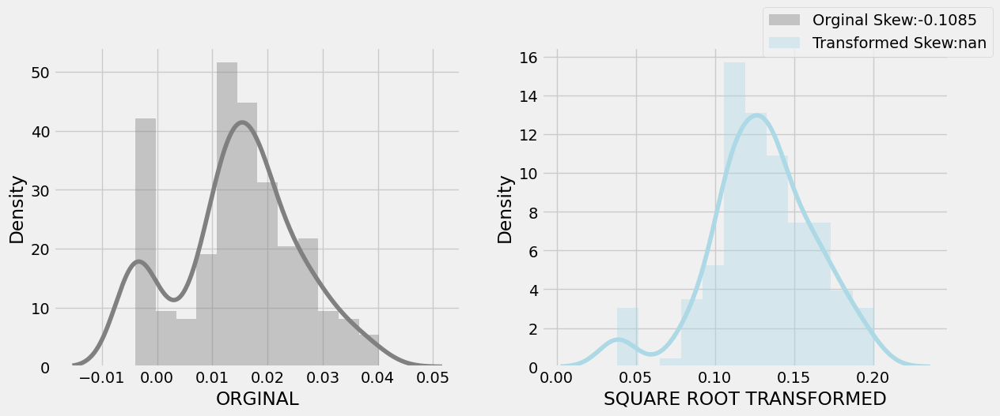

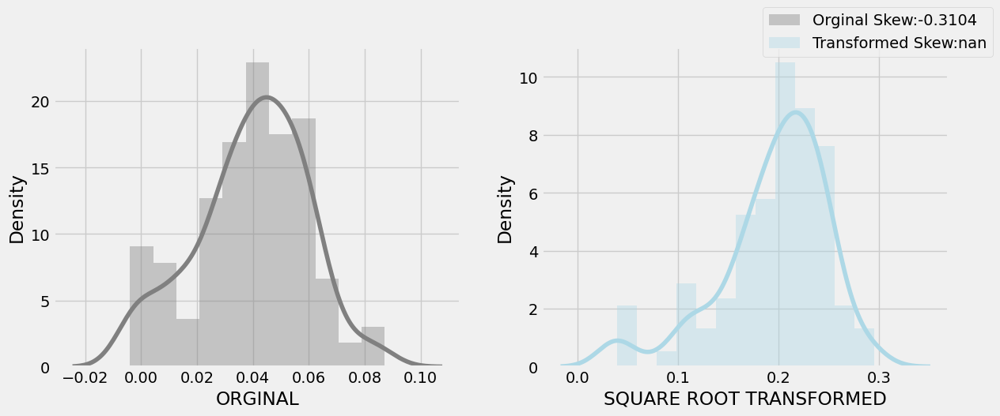

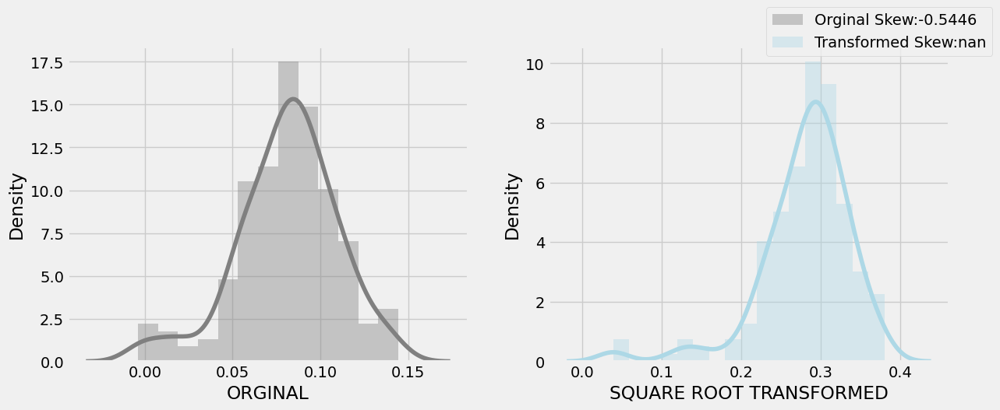

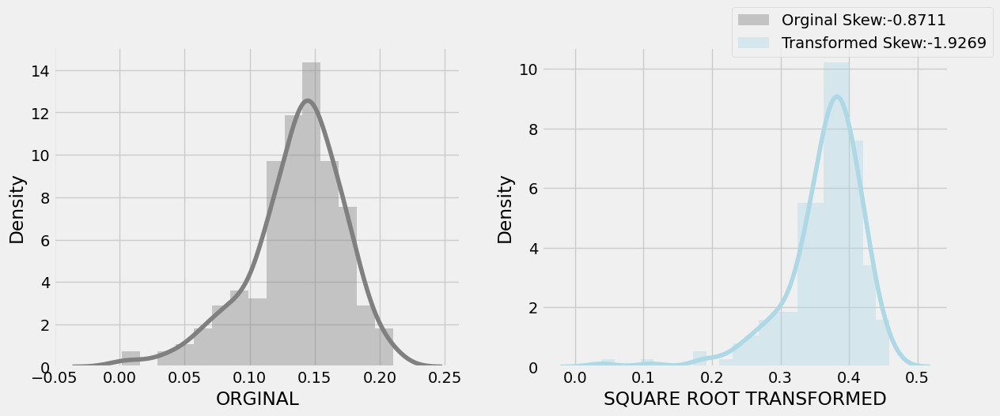

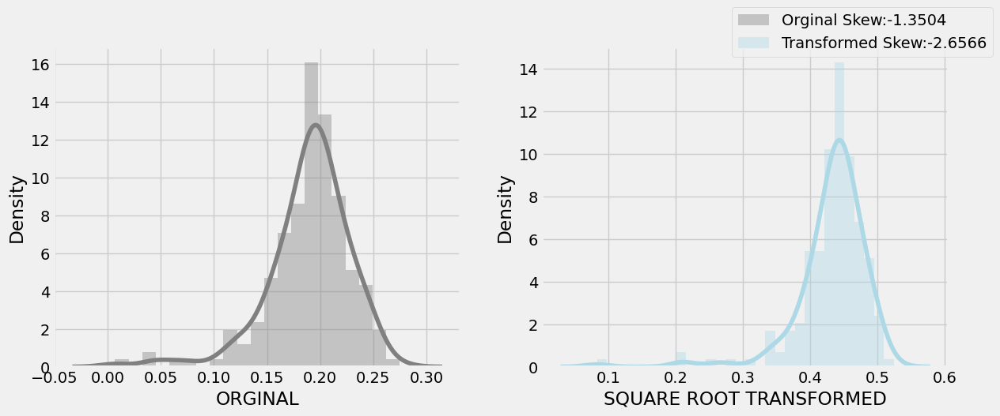

...

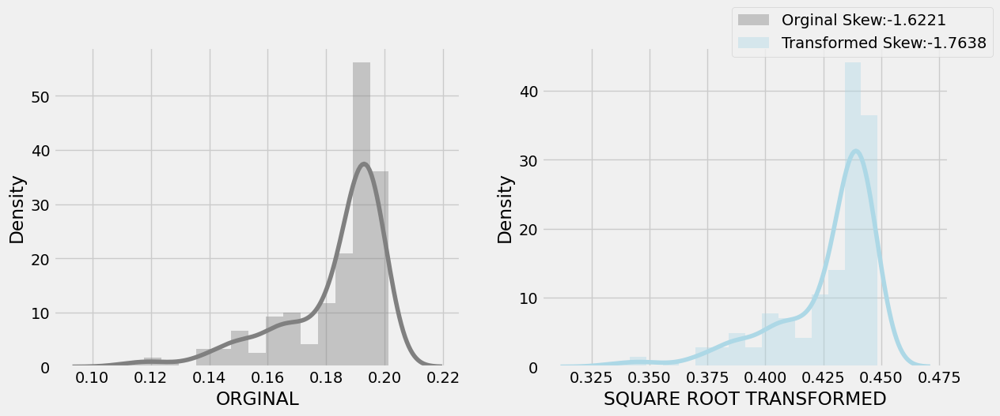

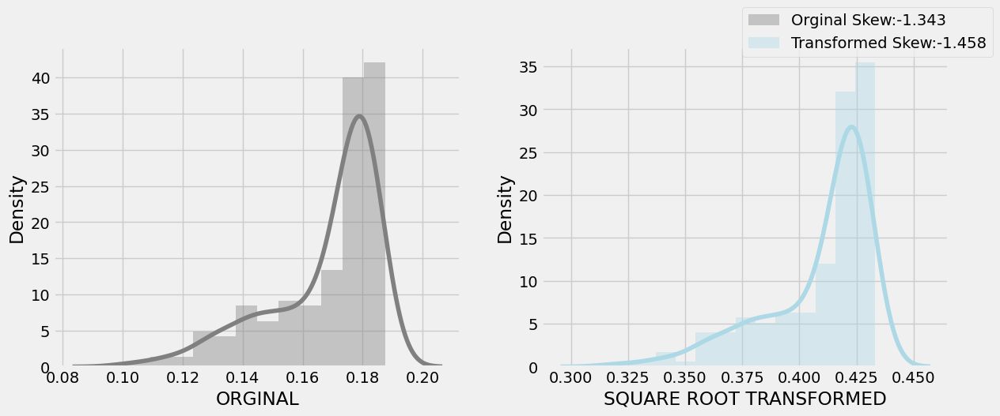

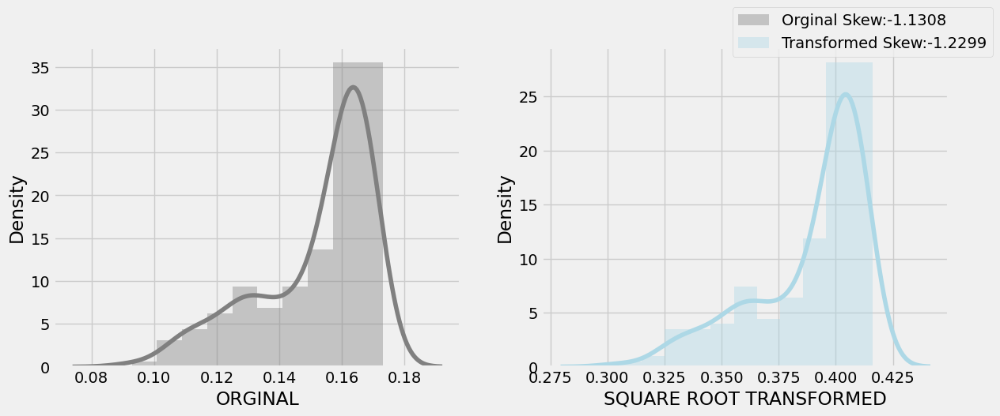

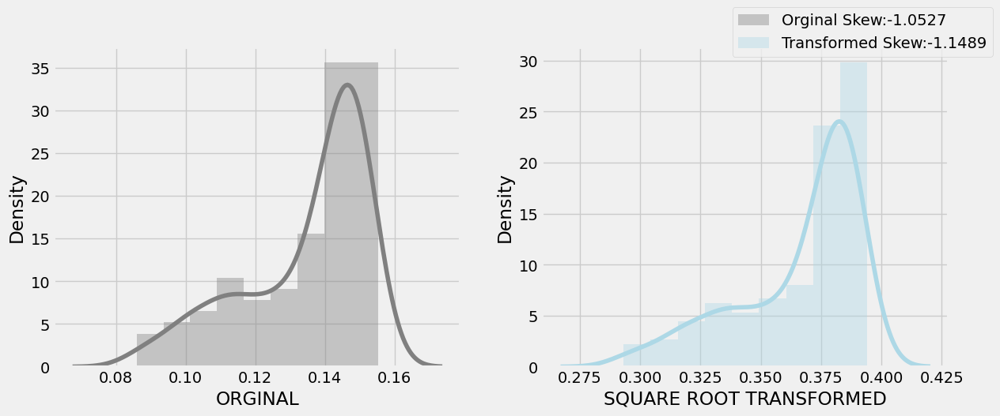

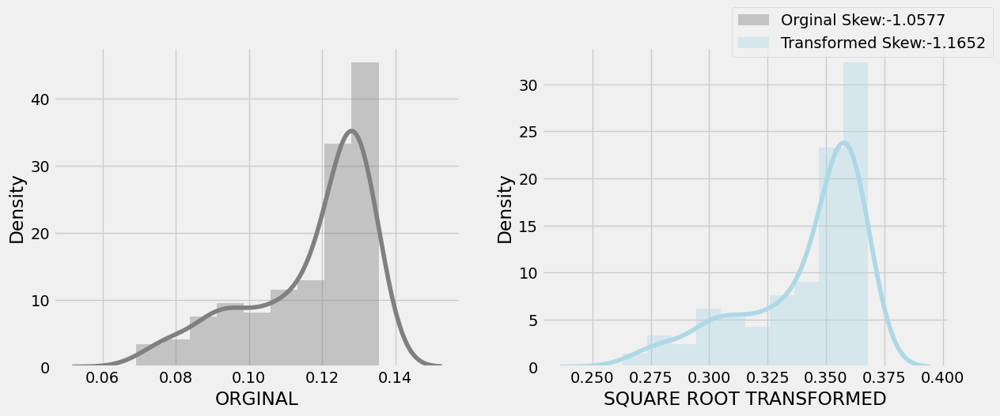

In [ ]:
df_transform = class0.iloc[:, 1:-2]
col = df_transform.columns.values

for i in col:
    sqrrt_target = df_transform[i]**(1/2)
    plt.rcParams["figure.figsize"] = 13,5
    fig,ax = plt.subplots(1,2)
    sns.distplot(df_transform[i], label= "Orginal Skew:{0}".format(np.round(skew(df_transform[i]),4)), color="grey", ax=ax[0], axlabel="ORGINAL")
    sns.distplot(sqrrt_target, label= "Transformed Skew:{0}".format(np.round(skew(sqrrt_target),4)), color="lightblue", ax=ax[1], axlabel="SQUARE ROOT TRANSFORMED")
    fig.legend()

Log Transform

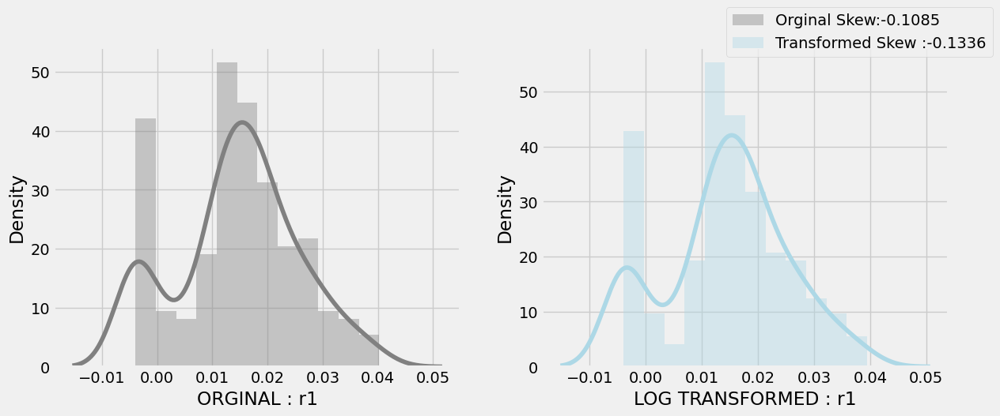

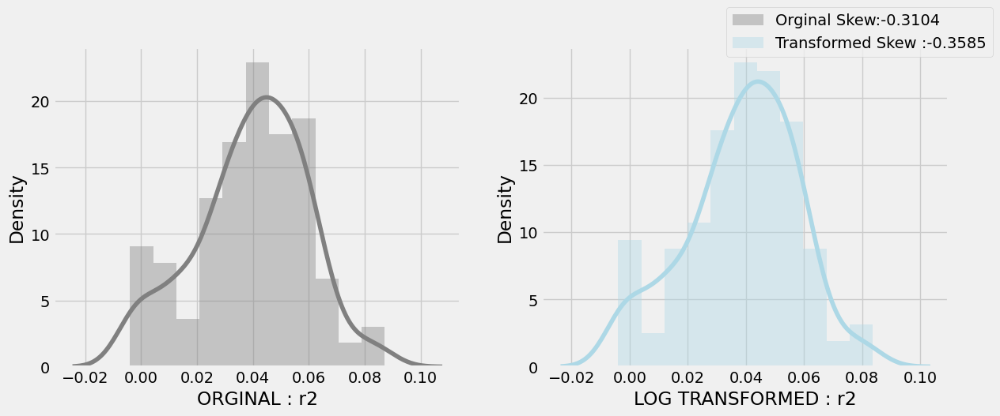

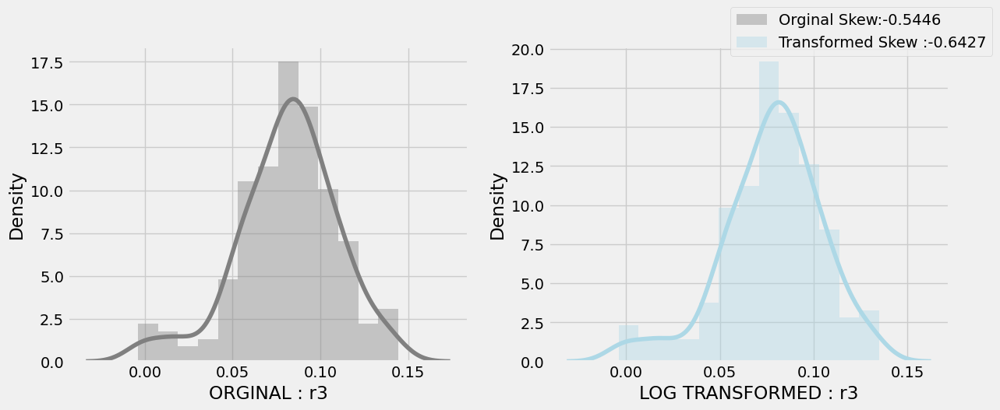

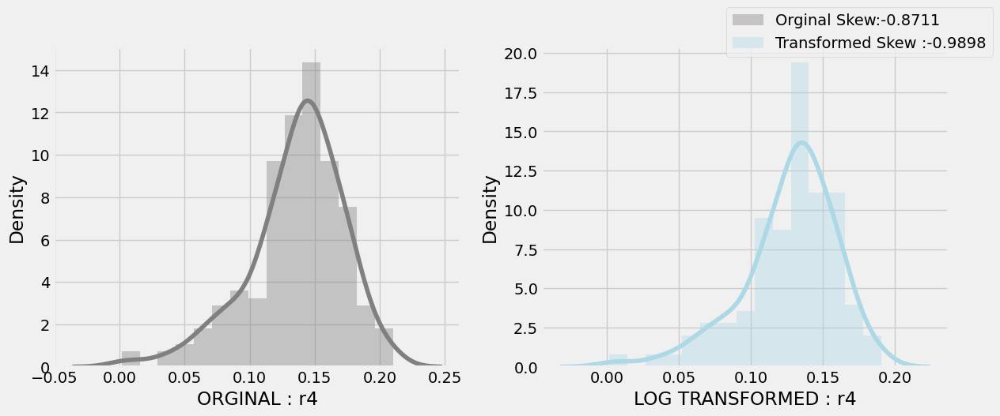

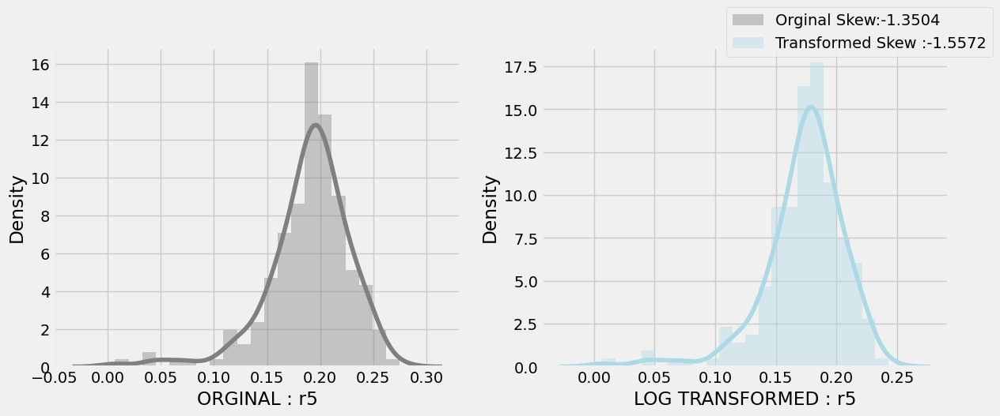

...

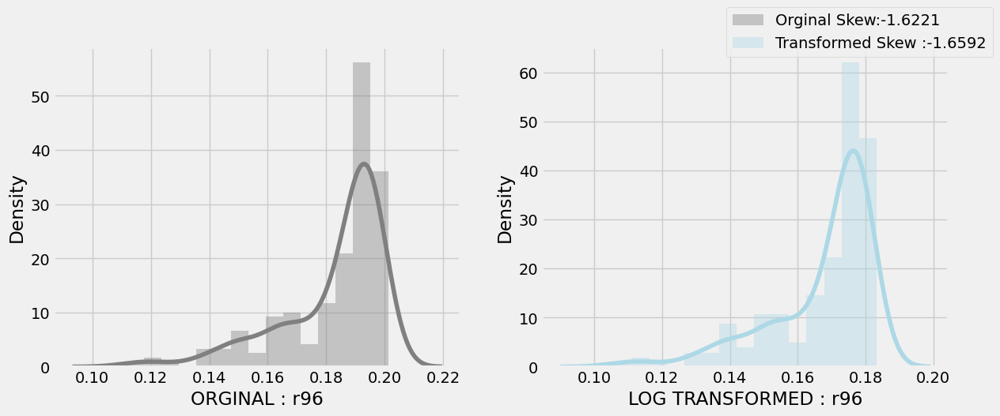

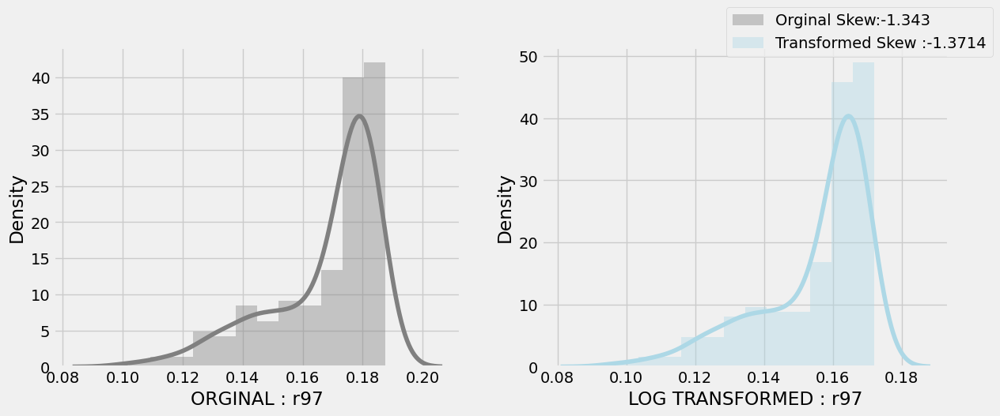

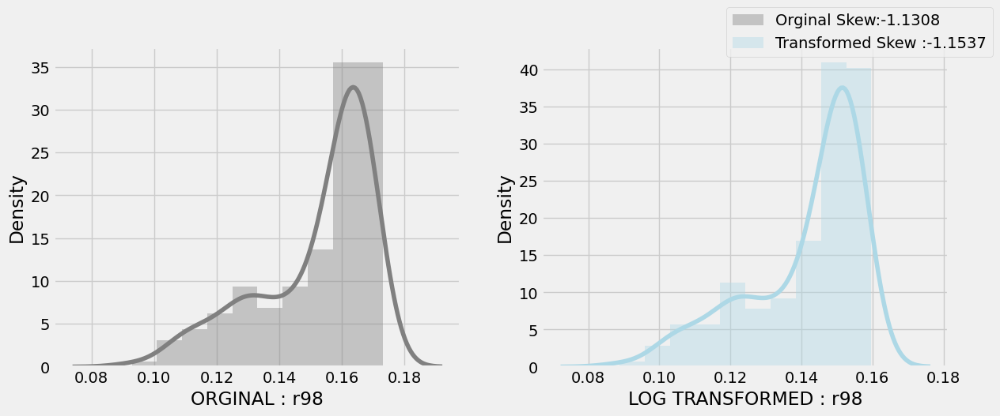

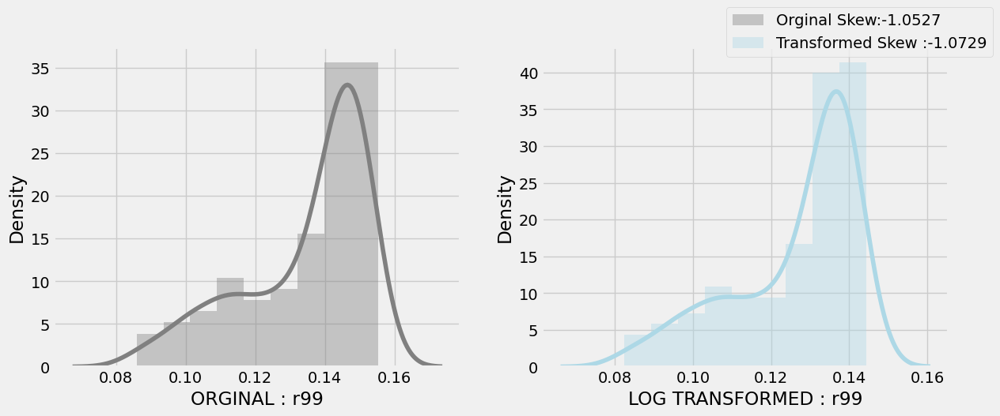

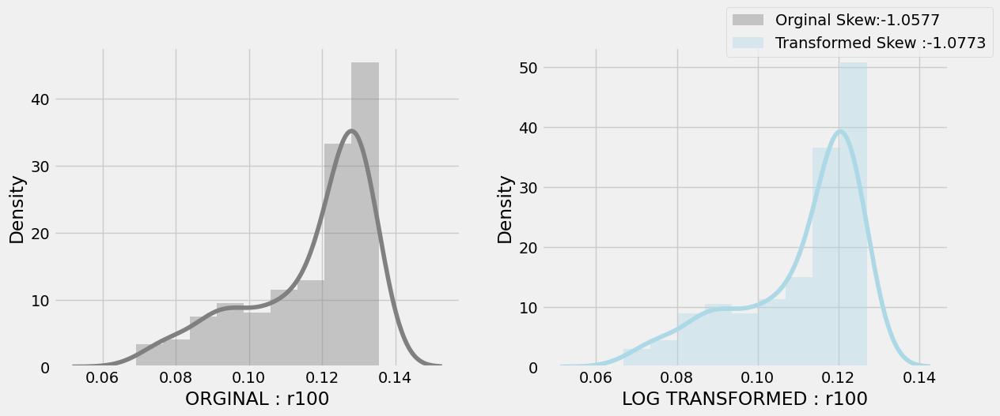

In [ ]:
df_transform = class0.iloc[:, 1:-2]

col = df_transform.columns.values
for i in col:
    log_target = np.log1p(df_transform[i])

    plt.rcParams["figure.figsize"] = 13,5
    fig,ax = plt.subplots(1,2)
    sns.distplot(df_transform[i], label= "Orginal Skew:{0}".format(np.round(skew(df_transform[i]),4)), color="grey", ax=ax[0], axlabel="ORGINAL : {0}".format(i))
    sns.distplot(log_target, label= "Transformed Skew :{0}".format(np.round(skew(log_target),4)), color="lightblue", ax=ax[1], axlabel="LOG TRANSFORMED : {0}".format(i))
    fig.legend()

Function Transformer

In [ ]:
df_transform = class0.iloc[:, 1:-2]
col = df_transform.columns.values

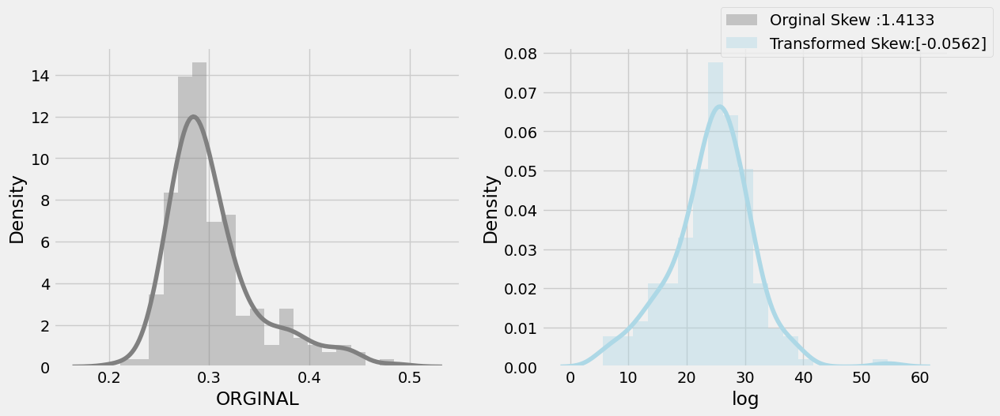

In [ ]:
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
square_transform = FunctionTransformer(lambda x: x ** -2.5)
ct = ColumnTransformer(transformers=[['square_transform',square_transform,list(range(len(df_transform[['r20']].columns)))]],remainder='passthrough')
square_X = ct.fit_transform(df_transform[['r20']]).copy()
square_X = pd.DataFrame(square_X,columns=[0]).copy()

plt.rcParams["figure.figsize"] = 13,5
fig,ax = plt.subplots(1,2)
sns.distplot(df_transform.r15, label= "Orginal Skew :{0}".format(np.round(skew(df_transform.r15),4)), color="grey", ax=ax[0], axlabel="ORGINAL")
sns.distplot(square_X, label= "Transformed Skew:{0}".format(np.round(skew(square_X),4)), color="lightblue", ax=ax[1], axlabel="log")
fig.legend()


Model Training and Evaluation

In [ ]:
#datasets
all_sheets_dict = pd.read_excel("/content/APEN DATA.xlsx", sheet_name=None)
day1_df = all_sheets_dict['GE_DAY1_1']
day2_df = all_sheets_dict['GE_DAY2']
day3_df = all_sheets_dict['GE_DAY3']
day4_df = all_sheets_dict['GE_DAY4']
day5_df = all_sheets_dict['GE_DAY5']
day6_df = all_sheets_dict['GE_DAY6']
day7_df = all_sheets_dict['GE_DAY7']
#day8_df = all_sheets_dict['GE_DAY8']
#day9_df = all_sheets_dict['GE_DAY9']
#day10_df = all_sheets_dict['GE_DAY10']

In [ ]:
import pandas as pd
#select 50 columns and a label
selected_columns = day2_df.iloc[:, list(range(50)) + [-1]]
print(selected_columns.columns)
apen_col = selected_columns.columns

Index(['r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9', 'r10', 'r11',
       'r12', 'r13', 'r14', 'r15', 'r16', 'r17', 'r18', 'r19', 'r20', 'r21',
       'r22', 'r23', 'r24', 'r25', 'r26', 'r27', 'r28', 'r29', 'r30', 'r31',
       'r32', 'r33', 'r34', 'r35', 'r36', 'r37', 'r38', 'r39', 'r40', 'r41',
       'r42', 'r43', 'r44', 'r45', 'r46', 'r47', 'r48', 'r49', 'r50', 'Class'],
      dtype='object')


In [ ]:
# datastes for testing on different days
data_2days = day1_df[apen_col].append(day2_df[apen_col])
data_3days = data_2days[apen_col].append(day3_df[apen_col])
data_4days = data_3days[apen_col].append(day4_df[apen_col])
data_5days = data_4days[apen_col].append(day5_df[apen_col])
data_6days = data_5days[apen_col].append(day6_df[apen_col])
data_7days = data_6days[apen_col].append(day7_df[apen_col])
#data_8days = data_7days[apen_col].append(day8_df[apen_col])
#data_9days = data_8days[apen_col].append(day9_df[apen_col])
#data_10days = data_9days[apen_col].append(day10_df[apen_col])

In [ ]:
from scipy.stats import skew, kurtosis
day1_data = data_2days.iloc[:,12:-1]  #change
col = day1_data.columns.values

square_transform = FunctionTransformer(lambda x: x ** -2.5)
for i in col:
  ct = ColumnTransformer(transformers=[['square_transform',square_transform,list(range(len(day1_data[[i]].columns)))]],remainder='passthrough')
  day1_data[i] = ct.fit_transform(day1_data[[i]]).copy()


In [ ]:
x= day1_data.copy()

from sklearn.preprocessing import LabelEncoder

#class_labels = ['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7', 'class8', 'class9', 'class10', 'class11']
#label_encoder = LabelEncoder()
#label_encoder.fit(class_labels)

# Convert class labels to numeric levels using transform method of LabelEncoder
#labels = label_encoder.transform(data_4days['Class'].values) #change

y = data_2days['Class'].values


from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(x)
x = sc.transform(x)
x = pd.DataFrame(x)
x.columns = day1_data.columns.values

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

In [ ]:
x_truth = day1_data.copy()
y_truth = data_2days['Class'].values
scaler = StandardScaler()
scaler.fit(x_truth)

x_truth = scaler.transform(x_truth)
x_truth = pd.DataFrame(x_truth)

x_truth.columns = day1_data.columns.values

In [ ]:
#Logistic Regression
parameters = {
    'C': np.linspace(1, 10, 10),
    'penalty':  ['l1', 'l2'] }
lr = LogisticRegression()
clf = GridSearchCV(lr, parameters, cv=5, verbose=1, n_jobs=3)
clf.fit(X_train, y_train)
lr_best = clf.best_estimator_
y_pred = lr_best.predict(X_test)
y_pred_sc = lr_best.predict(x_truth)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [ ]:
#Random Forest
rf_test = {"max_depth": [4,6,8,10,20],

           "min_samples_split": [1,2,3,4,5],"bootstrap": [True],
           "n_estimators" :[50,100,125],
           "criterion": ["gini","entropy"]}
tuning = GridSearchCV(RandomForestClassifier(), rf_test, scoring = 'accuracy', n_jobs = 6, cv = 5, verbose=1)
tuning.fit(X_train,y_train)
rf_model = tuning.best_estimator_
y_pred_rf = rf_model.predict(X_test)
y_pred_test_rf = rf_model.predict(x_truth)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


In [ ]:
# Saving the model
import pickle
model_filename = '1day_2ndtest.pkl' #change
with open(model_filename, 'wb') as file:
    pickle.dump(rf_model, file)

In [ ]:
def model_evaluation(y_test, y_pred, model_name):
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred,average='weighted')
    f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')
    f2 = fbeta_score(y_test, y_pred, beta = 2.0, average='weighted')

    results = pd.DataFrame([[model_name, acc, prec, rec, f1, f2]],
                       columns = ["Model", "Accuracy", "Precision", "Recall",
                                 "F1 SCore", "F2 Score"])
    results = results.sort_values(["Precision", "Recall", "F2 Score"], ascending = False)
    return results

In [ ]:
eval_ = model_evaluation(y_truth, y_pred_test_rf, "rf Classifier")
eval_

,Model,Accuracy,Precision,Recall,F1 SCore,F2 Score
0,rf Classifier,0.995833,0.995844,0.995833,0.995833,0.995832


# Test with unknown data

In [ ]:
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer

day3_test = day2_df.iloc[:, 12:-2] #change
df_data = day2_df.iloc[:,:-1] #change


col = day3_test.columns.values


square_transform = FunctionTransformer(lambda x: x ** -2.5)
for i in col:
  ct = ColumnTransformer(transformers=[['square_transform',square_transform,list(range(len(day3_test[[i]].columns)))]],remainder='passthrough')
  day3_test[i] = ct.fit_transform(day3_test[[i]]).copy()




from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
#class_labels = ['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7', 'class8', 'class9', 'class10', 'class11']
#label_encoder = LabelEncoder()
#label_encoder.fit(class_labels)
#labels = label_encoder.transform(day2_df['Class'].values) #change
y = day2_df['Class'].values

sc = StandardScaler()
x_day3 = day3_test.copy()
sc.fit(x_day3)
x_day3 = sc.transform(x_day3)
x_day3 = pd.DataFrame(x_day3)
x_day3.columns = day3_test.columns.values




x_truth = day3_test.copy()
y_truth = day2_df['Class'].values #change
scaler = StandardScaler()
scaler.fit(x_truth)

x_truth = scaler.transform(x_truth)
x_truth = pd.DataFrame(x_truth)

x_truth.columns = day3_test.columns.values

In [ ]:
import pickle
with open('/content/3day_4thtest.pkl', 'rb') as file: #change
    loaded_model = pickle.load(file)


y_pred_day3 = loaded_model.predict(x_day3)
y_pred_test_day3_rf = rf_model.predict(x_truth)

In [ ]:
model_evaluation(y_truth, y_pred_test_day3_rf, "rf Classifier")

,Model,Accuracy,Precision,Recall,F1 SCore,F2 Score
0,rf Classifier,0.995833,0.995844,0.995833,0.995833,0.995832


In [ ]:
def model_evaluation(y_test, y_pred, model_name):
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred,average='weighted')
    f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')
    f2 = fbeta_score(y_test, y_pred, beta = 2.0, average='weighted')

    results = pd.DataFrame([[model_name, acc, prec, rec, f1, f2]],
                       columns = ["Model", "Accuracy", "Precision", "Recall",
                                 "F1 SCore", "F2 Score"])
    results = results.sort_values(["Precision", "Recall", "F2 Score"], ascending = False)
    return results

In [ ]:
eval_ = model_evaluation(y_truth, y_pred_test_day3_rf, "rf Classifier")
eval_

,Model,Accuracy,Precision,Recall,F1 SCore,F2 Score
0,rf Classifier,0.995833,0.995844,0.995833,0.995833,0.995832


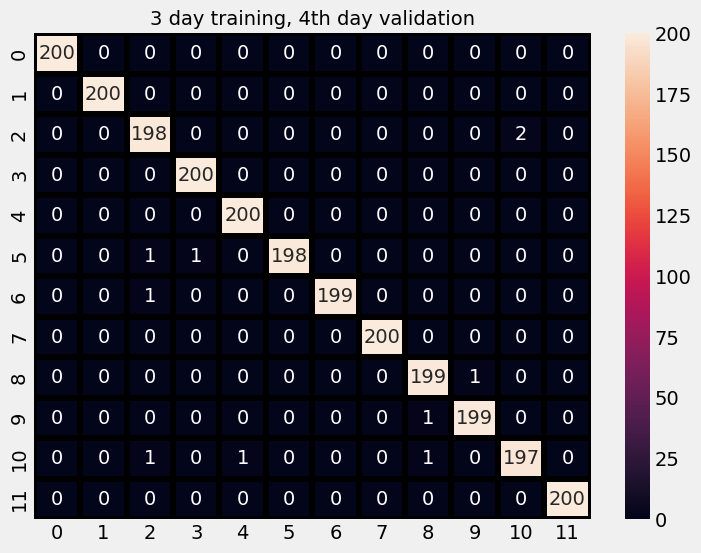

Misclassification Percentage: 0.42%
Accuracy Percentage: 99.58%


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

# Function to calculate misclassification rate class-wise
def misclassification_rate(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    misclass_rate = (cm.sum(axis=1) - cm.diagonal()) / cm.sum(axis=1)
    return misclass_rate

predictions = [y_pred_test_day3_rf]

for i, j in zip(predictions, eval_.Model.values):
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_truth, i)
    sns.heatmap(cm, annot=True, fmt="d", linecolor="k", linewidths=3)
    plt.title(j, fontsize=10)
    plt.title('3 day training, 4th day validation', fontsize=14)
    plt.show()

    # Calculate misclassification rate class-wise
    misclass_rate = misclassification_rate(y_truth, i)

    # Calculate total misclassification percentage and accuracy
    total_misclass = sum(misclass_rate) / len(misclass_rate)
    accuracy = accuracy_score(y_truth, i)

    # Display misclassification percentage and accuracy
    print(f"Misclassification Percentage: {total_misclass*100:.2f}%")
    print(f"Accuracy Percentage: {accuracy*100:.2f}%")


# Model Testing ends

In [ ]:
#Naive Bayes
gnb_clf = GaussianNB()
parameters = {
    'var_smoothing': [1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7, 1e-8, 1e-9, 1e-10, 1e-11]
}
clf = GridSearchCV(gnb_clf, parameters, cv=5, verbose=1)
clf.fit(X_train, y_train)
gnb_best = clf.best_estimator_
y_pred_gnb = clf.predict(X_test)
y_pred_test_gnb = gnb_best.predict(x_truth)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [ ]:
#Decision trees
params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4]}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=42), params, verbose=1, cv=5)
grid_search_cv.fit(X_train, y_train)
dt_best = grid_search_cv.best_estimator_
y_pred_dt = grid_search_cv.predict(X_test)
y_pred_test_dt = dt_best.predict(x_truth)

Fitting 5 folds for each of 294 candidates, totalling 1470 fits


In [ ]:
#Adaboost
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
parameters_list = {"algorithm" : ["SAMME","SAMME.R"],
                  "n_estimators" :[10,50,100,200,400]}
GSA = RandomizedSearchCV(AdaBoostClassifier(), param_distributions=parameters_list, n_iter=10, scoring = "roc_auc")
GSA.fit(X_train, y_train)
ada_best = GSA.best_estimator_
y_pred_ada = GSA.predict(X_test)
y_pred_test_ada = ada_best.predict(x_truth)


In [ ]:
#GradientBoost
gb_parameters_list = {'loss' : ['deviance'],
                 'n_estimators': randint(10, 50),
                 'max_depth': randint(1,10)}

GBM = RandomizedSearchCV(GradientBoostingClassifier(), param_distributions=gb_parameters_list, n_iter=10, scoring="roc_auc")
GBM.fit(X_train, y_train)
gb_best = GBM.best_estimator_
y_pred_gbm = GBM.predict(X_test)
y_pred_test_gbm = gb_best.predict(x_truth)

In [ ]:
#KNN
knn = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid = dict(n_neighbors=k_range)
grid_knn = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy',verbose=1)
grid_knn.fit(X_train,y_train)
knn_best = grid_knn.best_estimator_
y_pred_knn = grid_knn.predict(X_test)
y_pred_test_knn = knn_best.predict(x_truth)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


In [ ]:
#SVM
param_grid = {'C': np.linspace(1, 10, 10) , 'gamma': [0.01,0.05, 0.1,0.2],'kernel': ['rbf'],
             'degree':[3,4,5]}
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=1)
grid.fit(X_train,y_train)
svm_best = grid.best_estimator_
y_pred_svm1 = grid.predict(X_test)
y_pred_test_svm1 = svm_best.predict(x_truth)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


In [ ]:
#XGBOOST
XGB = XGBClassifier()
xgb_param_grid = {'learning_rate': [0.05, 0.01, 0.1, 0.2],
                  'max_depth': [2,3,4,5,8,10,12, 15],
                  'n_estimators': [50, 100,130, 150,200]}
gsXBC = GridSearchCV(XGB, param_grid = xgb_param_grid, cv = 5, scoring = "accuracy", n_jobs = 6, verbose = 1)
gsXBC.fit(X_train,y_train)
xgb_best = gsXBC.best_estimator_
y_pred_xgb = xgb_best.predict(X_test)
y_pred_test_xgb = xgb_best.predict(x_truth)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


In [ ]:
#Voting
voting_model_ = VotingClassifier(estimators=[('gb', gb_best),
                                            ("XGB", xgb_best),
                                            ("rf", rf_model)],
                                voting = 'soft', weights = [2,2,2])

votingModel_ = voting_model_.fit(X_train, y_train)
y_pred_voting = votingModel_.predict(X_test)
y_pred_test_voting = voting_model_.predict(x_truth)

In [ ]:
def model_evaluation(y_test, y_pred, model_name):
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred,average='weighted')
    f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')
    f2 = fbeta_score(y_test, y_pred, beta = 2.0, average='weighted')

    results = pd.DataFrame([[model_name, acc, prec, rec, f1, f2]],
                       columns = ["Model", "Accuracy", "Precision", "Recall",
                                 "F1 SCore", "F2 Score"])
    results = results.sort_values(["Precision", "Recall", "F2 Score"], ascending = False)
    return results


lr = model_evaluation(y_truth, y_pred_sc, "Logistic Regression")
svm = model_evaluation(y_truth, y_pred_test_svm1, "SVM")
knn = model_evaluation(y_truth, y_pred_test_knn, "K-Nearest Neighbours")
rf = model_evaluation(y_truth, y_pred_test_rf, "Random Forest")
gb = model_evaluation(y_truth, y_pred_test_gbm, "Gradient Boost")
ada = model_evaluation(y_truth, y_pred_test_ada, "Adaboost")
dt = model_evaluation(y_truth, y_pred_test_dt, "Decision Trees")
gnb = model_evaluation(y_truth, y_pred_test_gnb, "Gaussian Naive Bayes")
xgb = model_evaluation(y_truth, y_pred_test_xgb, "XGBoost")
vc = model_evaluation(y_truth, y_pred_test_voting, "Voting Classifier")

In [ ]:
eval_ =lr.append(svm).append(knn).append(rf).append(gb).append(ada).append(dt).append(gnb).append(xgb).append(vc).sort_values(["Precision",
"Recall", "F2 Score"], ascending = False).reset_index().drop(columns = "index")
eval_
eval_.sort_values(by='Accuracy', ascending = False)

,Model,Accuracy,Precision,Recall,F1 SCore,F2 Score
0,Voting Classifier,0.873333,0.874127,0.873333,0.873418,0.873290
1,Random Forest,0.873333,0.874006,0.873333,0.873127,0.873122
2,XGBoost,0.870000,0.870597,0.870000,0.870035,0.869950
3,Gradient Boost,0.855833,0.857311,0.855833,0.856085,0.855817
4,SVM,0.683750,0.688896,0.683750,0.683824,0.683251
7,Logistic Regression,0.576250,0.573242,0.576250,0.573720,0.574991
5,Decision Trees,0.574167,0.598300,0.574167,0.578754,0.574225
6,K-Nearest Neighbours,0.568750,0.576497,0.568750,0.568674,0.567740
8,Gaussian Naive Bayes,0.410833,0.410353,0.410833,0.392333,0.398697
9,Adaboost,0.242500,0.117359,0.242500,0.148836,0.186386


In [ ]:
import pickle
model_filename = 'voting.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(votingModel_, file)


model_filename = 'rf.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(rf_model, file)


model_filename = 'xgb.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(xgb_best, file)


model_filename = 'gb.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(gb_best, file)


model_filename = 'svm.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(svm_best, file)


model_filename = 'lr.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(lr_best, file)


model_filename = 'dt.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(dt_best, file)

model_filename = 'knn.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(knn_best, file)

model_filename = 'gnb.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(gnb_best, file)


model_filename = 'ada.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(ada_best, file)

In [ ]:
# Load the saved model
with open('voting.pkl', 'rb') as file:
    loaded_model = pickle.load(file)


y_pred_voting_ = loaded_model.predict(X_test)
y_pred_test_voting_ = loaded_model.predict(x_truth)

In [ ]:
model_evaluation(y_truth, y_pred_test_voting_, "Voting Classifier")

,Model,Accuracy,Precision,Recall,F1 SCore,F2 Score
0,Voting Classifier,0.873333,0.874127,0.873333,0.873418,0.87329


In [ ]:
#sns.kdeplot(data=class1[class1.index==2].values[0][2:-2], label="class0", shade=True, color = "grey", edgecolor = "black")

In [ ]:
predictions = [y_pred_sc, y_pred_test_svm1, y_pred_test_knn, y_pred_test_rf, y_pred_test_gbm, y_pred_test_ada,
               y_pred_test_dt, y_pred_test_gnb, y_pred_test_xgb, y_pred_test_voting]

for i, j in zip(predictions, eval_.Model.values):
    plt.figure(figsize=(8,6))
    sns.heatmap(confusion_matrix(y_truth, i),
                annot=True,fmt = "d",linecolor="k",linewidths=3)

    plt.title(j,fontsize=10)
    plt.show()

# Model Testing

In [ ]:
all_sheets_dict = pd.read_excel("/content/APEN DATA.xlsx", sheet_name=None)
day2_df = all_sheets_dict['GE_DAY4']

In [ ]:
day2_df

,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,...,r93,r94,r95,r96,r97,r98,r99,r100,Filename,Class
0,0.032755,0.059440,0.102761,0.169016,0.226698,0.234629,0.267499,0.297018,0.288309,0.279652,...,0.227689,0.218576,0.203325,0.190507,0.176628,0.162421,0.145996,0.128832,'day2_class0_0.csv',class0
1,-0.003929,0.017817,0.079631,0.136887,0.145137,0.209241,0.262718,0.300090,0.344324,0.381514,...,0.217263,0.200855,0.185620,0.168687,0.151125,0.132901,0.114270,0.094979,'day2_class0_1.csv',class0
2,0.018597,0.062925,0.080662,0.123437,0.183571,0.234360,0.271808,0.278203,0.293704,0.286903,...,0.226359,0.215219,0.204960,0.194303,0.180745,0.165172,0.149429,0.128184,'day2_class0_10.csv',class0
3,0.019523,0.057552,0.130112,0.188643,0.192898,0.234826,0.250953,0.270120,0.285666,0.302478,...,0.227342,0.217537,0.208870,0.199645,0.187226,0.172084,0.153386,0.133765,'day2_class0_100.csv',class0
4,0.013218,0.031048,0.054316,0.117296,0.234194,0.269059,0.317237,0.346290,0.346144,0.351784,...,0.227762,0.215249,0.200190,0.181635,0.166227,0.148751,0.131240,0.114932,'day2_class0_101.csv',class0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,0.037573,0.060682,0.097757,0.140170,0.179808,0.210069,0.226717,0.234622,0.254664,0.272814,...,0.241895,0.231585,0.221764,0.210993,0.200622,0.186062,0.169087,0.149093,'day2_class9_95.csv',class9
2396,0.037037,0.054142,0.068371,0.115541,0.164693,0.236833,0.247306,0.253061,0.264841,0.289221,...,0.245324,0.235941,0.224229,0.212885,0.200751,0.186258,0.169913,0.149009,'day2_class9_96.csv',class9
2397,0.028404,0.044187,0.076230,0.143667,0.184586,0.192460,0.207820,0.241297,0.260723,0.279931,...,0.244066,0.234746,0.223351,0.211025,0.198107,0.184197,0.166969,0.146208,'day2_class9_97.csv',class9
2398,0.014389,0.050484,0.125267,0.121559,0.183070,0.203825,0.251079,0.280656,0.311835,0.307670,...,0.238867,0.229295,0.219055,0.209625,0.198622,0.187026,0.171028,0.152927,'day2_class9_98.csv',class9


In [ ]:
day2_df.iloc[1:3, :]

,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,...,r43,r44,r45,r46,r47,r48,r49,r50,filename,Class
1,-0.003929,0.017817,0.079631,0.136887,0.145137,0.209241,0.262718,0.300090,0.344324,0.381514,...,0.297310,0.301228,0.301304,0.300018,0.293324,0.28790,0.290215,0.290151,'day4_class0_1.csv',class0
2,0.018597,0.062925,0.080662,0.123437,0.183571,0.234360,0.271808,0.278203,0.293704,0.286903,...,0.254891,0.254232,0.253437,0.251295,0.249421,0.24912,0.250078,0.264341,'day4_class0_10.csv',class0


In [ ]:
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer

day2_data = day2_df.iloc[:, 12:-2]
df_data = day2_df.iloc[:, :]

col = day2_data.columns.values

square_transform = FunctionTransformer(lambda x: x ** -2.5)
for i in col:
  ct = ColumnTransformer(transformers=[['square_transform',square_transform,list(range(len(day2_data[[i]].columns)))]],remainder='passthrough')
  day2_data[i] = ct.fit_transform(day2_data[[i]]).copy()

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
class_labels = ['class0', 'class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7', 'class8', 'class9', 'class10', 'class11']
label_encoder = LabelEncoder()
label_encoder.fit(class_labels)
labels = label_encoder.transform(df_data['Class'].values)
y = labels

sc = StandardScaler()
x_day2 = day2_data.copy()
sc.fit(x_day2)
x_day2 = sc.transform(x_day2)
x_day2 = pd.DataFrame(x_day2)
x_day2.columns = day2_data.columns.values


In [ ]:
x_truth = day2_data.copy()
y_truth = labels
scaler = StandardScaler()
scaler.fit(x_truth)

x_truth = scaler.transform(x_truth)
x_truth = pd.DataFrame(x_truth)

x_truth.columns = day2_data.columns.values

In [ ]:
# Load the saved model
import pickle
with open('/content/rf.pkl', 'rb') as file:
    loaded_model = pickle.load(file)


y_pred_voting_ = loaded_model.predict(x_day2)
y_pred_test = loaded_model.predict(x_truth)

In [ ]:
def model_evaluation(y_test, y_pred, model_name):
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred,average='weighted')
    f1 = sklearn.metrics.f1_score(y_test, y_pred, average='weighted')
    f2 = fbeta_score(y_test, y_pred, beta = 2.0, average='weighted')

    results = pd.DataFrame([[model_name, acc, prec, rec, f1, f2]],
                       columns = ["Model", "Accuracy", "Precision", "Recall",
                                 "F1 SCore", "F2 Score"])
    results = results.sort_values(["Precision", "Recall", "F2 Score"], ascending = False)
    return results

In [ ]:
eval_ = model_evaluation(y_truth, y_pred_test, "rf Classifier")
eval_

,Model,Accuracy,Precision,Recall,F1 SCore,F2 Score
0,rf Classifier,0.873333,0.874006,0.873333,0.873127,0.873122


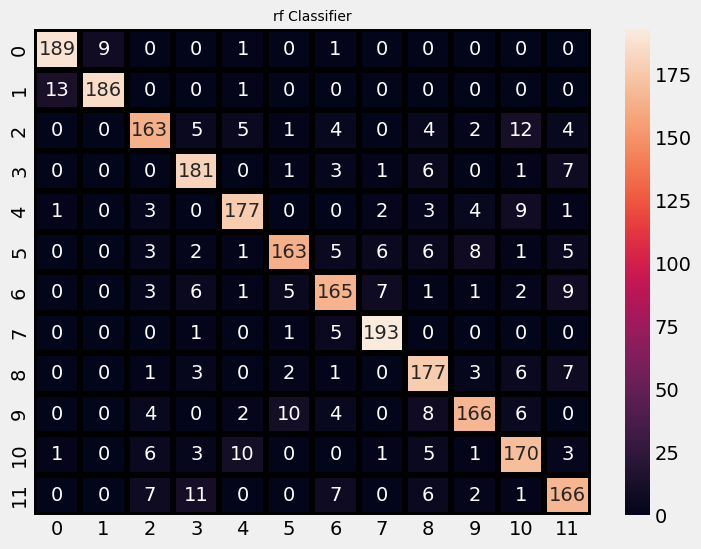

Misclassification Percentage: 12.67%
Accuracy Percentage: 87.33%


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

# Function to calculate misclassification rate class-wise
def misclassification_rate(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    misclass_rate = (cm.sum(axis=1) - cm.diagonal()) / cm.sum(axis=1)
    return misclass_rate

predictions = [y_pred_test]

for i, j in zip(predictions, eval_.Model.values):
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_truth, i)
    sns.heatmap(cm, annot=True, fmt="d", linecolor="k", linewidths=3)
    plt.title(j, fontsize=10)
    plt.show()

    # Calculate misclassification rate class-wise
    misclass_rate = misclassification_rate(y_truth, i)

    # Calculate total misclassification percentage and accuracy
    total_misclass = sum(misclass_rate) / len(misclass_rate)
    accuracy = accuracy_score(y_truth, i)

    # Display misclassification percentage and accuracy
    print(f"Misclassification Percentage: {total_misclass*100:.2f}%")
    print(f"Accuracy Percentage: {accuracy*100:.2f}%")


In [ ]:
from numpy.core.function_base import linspace
xline_ = linspace(1,100,100)
X_df = pd.DataFrame(truth_data, columns=['s1', 's2', 's3', 's4', 'cycle'])
X_df["id"] = xline_

y_df = pd.DataFrame(y_pred_test_voting, columns=["label_bnc"])
y_df["actual_label"] = y_truth

frames = [X_df, y_df]
data = pd.concat(frames, axis=1)

plt.subplots(figsize=(8, 8))
sns.scatterplot(x="id", y="s1", hue='label_bnc', s=200, data=data)
plt.show()
plt.subplots(figsize=(8, 8))
sns.scatterplot(x="id", y="s1", hue='actual_label', s=200, data=data)

# The Scattering experiment

In [ ]:
import pandas as pd
scatter_data = pd.read_csv("/content/day1_class_11_2395.csv")
scatter_data.head()

,Unnamed: 0,real,imag,Class
0,0,2.0,-3.0,11
1,1,3.0,-3.0,11
2,2,-3.0,1.0,11
3,3,-1.0,-5.0,11
4,4,-7.0,-2.0,11


In [ ]:
!pip install kymatio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.6/87.6 kB 589.3 kB/s eta 0:00:00


In [ ]:
!pip install numpy

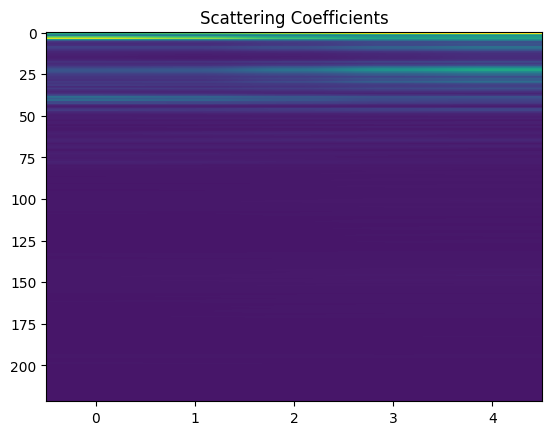

In [ ]:
import numpy as np
from kymatio.sklearn import Scattering1D
import matplotlib.pyplot as plt
import scipy.io
import glob
# import Tensorflow as tf

def generate_harmonic_signal(T, num_intervals=4, gamma=0.9, random_state=42):
    """
    Generates a harmonic signal, which is made of piecewise constant notes
    (of random fundamental frequency), with half overlap
    """
    rng = np.random.RandomState(random_state)
    num_notes = 2 * (num_intervals - 1) + 1
    support = T // num_intervals
    half_support = support // 2

    base_freq = 0.1 * rng.rand(num_notes) + 0.05
    phase = 2 * np.pi * rng.rand(num_notes)
    window = np.hanning(support)
    x = np.zeros(T, dtype='float32')
    t = np.arange(0, support)
    u = 2 * np.pi * t
    for i in range(num_notes):
        ind_start = i * half_support
        note = np.zeros(support)
        for k in range(1):
            note += (np.power(gamma, k) *
                     np.cos(u * (k + 1) * base_freq[i] + phase[i]))
        x[ind_start:ind_start + support] += note * window

    return x

def calc_scattering(x):
    J = 6
    Q = 16
    T = x.shape[0]

    scattering = Scattering1D(J, T, Q)
    meta = scattering.meta()

    Sx = scattering(x)

    return Sx, meta


import numpy as np




# Assuming you have your own data in the variable 'data_array'
data_array = np.array([[-1.0, -1.0], [0.0, -1.0], [-4.0, -1.0], [-11.0, 1.0], [-8.0, 6.0], [-3.0, 9.0], [10.0, 3.0], [1.0, -11.0], [-9.0, -5.0], [-10.0, -1.0], [-9.0, 7.0], [3.0, 8.0], [6.0, 0.0], [4.0, -11.0], [-14.0, -6.0], [-4.0, 1.0], [-15.0, 6.0], [15.0, 10.0], [-6.0, -7.0], [18.0, -5.0], [-40.0, -13.0], [89.0, 16.0], [378.0, -74.0], [328.0, -226.0], [117.0, -401.0], [-342.0, -203.0], [-203.0, 342.0], [312.0, 276.0], [390.0, -32.0], [335.0, -239.0], [-8.0, -415.0], [-383.0, -81.0], [-143.0, 371.0], [300.0, 277.0], [388.0, -25.0], [273.0, -283.0], [-106.0, -361.0], [-378.0, 29.0], [-58.0, 387.0], [329.0, 235.0], [388.0, -101.0], [173.0, -363.0], [-234.0, -318.0], [-383.0, 113.0], [-42.0, 410.0], [340.0, 235.0], [383.0, -136.0], [93.0, -387.0], [-308.0, -250.0], [-366.0, 183.0], [-6.0, 389.0], [354.0, 192.0], [349.0, -185.0], [65.0, -385.0], [-233.0, -321.0], [-389.0, -116.0], [-398.0, 57.0], [-385.0, 119.0], [-392.0, 134.0], [-402.0, 119.0], [-411.0, 82.0], [-404.0, 19.0], [-394.0, -80.0], [-358.0, -176.0], [-293.0, -260.0], [-261.0, -318.0], [-205.0, -340.0], [-132.0, -372.0], [-77.0, -401.0], [-23.0, -419.0], [25.0, -415.0], [80.0, -396.0], [141.0, -378.0], [183.0, -361.0], [227.0, -351.0], [278.0, -312.0], [308.0, -295.0], [335.0, -235.0], [363.0, -177.0], [387.0, -171.0], [405.0, -106.0], [416.0, -50.0], [418.0, 15.0], [409.0, 81.0], [394.0, 121.0], [351.0, 190.0], [311.0, 249.0], [280.0, 300.0], [242.0, 338.0], [179.0, 350.0], [124.0, 396.0], [74.0, 377.0], [7.0, 385.0], [-6.0, 416.0], [-59.0, 385.0], [-117.0, 399.0], [-163.0, 361.0], [-225.0, 343.0], [-264.0, 314.0], [-313.0, 257.0], [-351.0, 220.0], [-357.0, 219.0], [-312.0, 245.0], [-240.0, 350.0], [65.0, 392.0], [335.0, 154.0], [213.0, -306.0], [-367.0, -172.0], [20.0, 397.0], [275.0, -276.0], [-396.0, 0.0], [302.0, 255.0], [-68.0, -393.0], [-188.0, 332.0], [374.0, -156.0], [-370.0, -148.0], [195.0, 348.0], [142.0, -383.0], [-347.0, 146.0], [370.0, 154.0], [-49.0, -384.0], [-205.0, 287.0], [400.0, -42.0], [-271.0, -330.0], [-111.0, 381.0], [337.0, -156.0], [-336.0, -182.0], [-15.0, 389.0], [394.0, -77.0], [-19.0, -407.0], [-377.0, -161.0], [-370.0, 166.0], [-259.0, 294.0], [-221.0, 322.0], [-235.0, 303.0], [-309.0, 267.0], [-363.0, 173.0], [-392.0, 35.0], [-411.0, -65.0], [-385.0, -82.0], [-391.0, -67.0], [-386.0, 164.0], [-85.0, 379.0], [340.0, 180.0], [139.0, -382.0], [-396.0, 40.0], [277.0, 270.0]]
)

x = data_array.flatten()

# Now apply the scattering to the flattened 1D array
Sx, meta = calc_scattering(x)

# Rest of the code remains the same, for example, you can plot the scattering coefficients
plt.imshow(Sx, aspect='auto')
plt.title('Scattering Coefficients')
plt.show()












In [ ]:
Sx

array([[ 8.83563603e-02, -2.61235852e+00, -1.45866885e+00,
        -4.99616814e-01, -1.84901334e+00],
       [ 2.43915632e+01,  2.84636255e+01,  3.45407111e+01,
         3.90316679e+01,  4.03309628e+01],
       [ 1.42822594e+01,  1.45196742e+01,  1.55567856e+01,
         1.69941442e+01,  1.82181316e+01],
       ...,
       [ 3.36724744e-03,  3.20158538e-03,  3.20071538e-03,
         3.38401477e-03,  3.67412277e-03],
       [ 2.75428671e-03,  2.47601658e-03,  2.52466296e-03,
         2.83866129e-03,  3.21524194e-03],
       [ 6.19836792e-03,  5.63435780e-03,  5.08889977e-03,
         4.87925498e-03,  5.09005868e-03]])

In [ ]:
np.where(meta['order'] == 2)

(array([ 64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
         77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
         90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
        103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
        116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
        129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
        142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
        155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
        168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180,
        181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193,
        194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206,
        207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,
        220, 221]),)

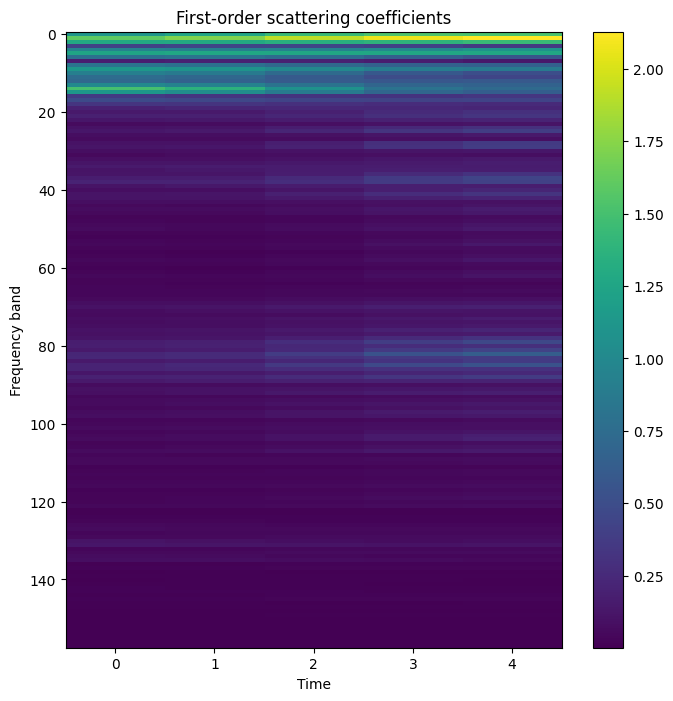

In [ ]:
# Assuming you have already computed Sx and meta using calc_scattering function
order1 = np.where(meta['order'] == 2)
plt.figure(figsize=(8, 8))
plt.imshow(Sx[order1], aspect='auto')
plt.title('First-order scattering coefficients')
plt.xlabel('Time')
plt.ylabel('Frequency band')
plt.colorbar()
plt.show()
